<div <h1 <strong style="color:#3F497F;font-size:70px;font-family:Georgia;text-align:center;">CUSTOMER SEGMENTATION</strong></div>

<div style="float:center;margin-left:170px;max-width:65%;">   
<img src="https://cdn.dribbble.com/users/4479253/screenshots/10879397/media/3b79ad20efc237c121255bed7b1d03f5.jpg"></div>

<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">What are CRM Analytics?</strong> </div>        
<div <h1 <strong style="color:#3F497F;font-size:18px;font-family:Georgia;">CRM analytics are data that demonstrate your company’s sales and customer service performance. CRM analytics also presents customer data that you can use to inform smarter business decisions. Typically, you’ll use CRM software to obtain CRM analytics and automate all your data collection and report generation.</strong> </div>


    


<div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p></p><div class="list-group" id="list-tab" role="tablist">
  <h3 class="list-group-item list-group-item-action active" data-toggle="list" role="tab" aria-controls="home" style = "background-color:#3F497F;font-family:Georgia;color:#F7C04A;font-size:200%;text-align:LEFT;border-radius:20px 40px;overflow:hidden;border-style:dotted;border-width:1.8px;border-color:#F7C04A;">...Table of Contents...</h3>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#1" role="tab" aria-controls="home" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">Data Understanding<span class="badge badge-primary badge-pill">1</span></a>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#2" role="tab" aria-controls="messages" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">Data Preparation<span class="badge badge-primary badge-pill">2</span></a>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#3" role="tab" aria-controls="settings" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">RFM Metrics<span class="badge badge-primary badge-pill">3</span></a>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#4" role="tab" aria-controls="settings" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">RFM Scores<span class="badge badge-primary badge-pill">4</span></a> 
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#5" role="tab" aria-controls="settings" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">RFM Metrics<span class="badge badge-primary badge-pill">5</span></a>
    <a class="list-group-item list-group-item-action" data-toggle="list" href="#5" role="tab" aria-controls="settings" target="_self" style = "color:#000000; font-family:Charter;font-size:120%;">Functionalize<span class="badge badge-primary badge-pill">5</span></a>
</div>
</div>
</div>


<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">Packages-Libraries-Settings 📜</strong> </div>



In [1]:
!pip install lifetimes

# Temel kütüphanelerimiz.
import pandas as pd
import numpy as np
import warnings
import datetime as dt


# Beklenti hesaplamak için kullanacağımız kütüphaneler.


# Görselleştirme için kullandığımız kütüphaneler.
from lifetimes.plotting import plot_period_transactions
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px
from plotly.tools import FigureFactory as ff

sns.set_style('whitegrid')
palette = 'Set2'

# Birtakım ayarlar.
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 160)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.2/584.2 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 kB 4.3 MB/s eta 0:00:00


In [2]:
df = pd.read_csv('/kaggle/input/customer-segmentation-rfm/customer_segmentation_500k.csv')
df_ = df.copy()
df.head()

,customer_id,qtt_order,total_spent,last_order
0,0,272,90067.350,2022-10-23 09:00:00
1,1,825,194707.210,2022-09-28 09:00:00
2,2,132,224159.970,2022-06-07 19:00:00
3,3,62,287130.720,2022-01-25 09:00:00
4,4,4,71469.240,2022-07-01 18:00:00


In [3]:
# Veri turlerinde yapacagimiz degisiklikler ile hafiza kullanimini iyilestirelim.
# Bu sayede hafiza kullanimini %73 oraninda azalttik
def reduce_memory_usage(df, verbose=True):
    numerics = ["int8", "int16", "int32", "int64", "float16", "float32", "float64"]
    start_mem = df.memory_usage().sum() / 1024 ** 2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == "int":
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if (
                    c_min > np.finfo(np.float16).min
                    and c_max < np.finfo(np.float16).max
                ):
                    df[col] = df[col].astype(np.float16)
                elif (
                    c_min > np.finfo(np.float32).min
                    and c_max < np.finfo(np.float32).max
                ):
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024 ** 2
    if verbose:
        print(
            "Mem. usage decreased to {:.2f} Mb ({:.1f}% reduction)".format(
                end_mem, 100 * (start_mem - end_mem) / start_mem
            )
        )
    return df

df = reduce_memory_usage(df, verbose=True)

Mem. usage decreased to 8.58 Mb (43.7% reduction)


<a id = "1"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">DATA UNDERSTANDING</strong> </div>




In [4]:
def check_df(dataframe, head=5):
    print(" SHAPE ".center(70,'-'))
    print('Rows: {}'.format(dataframe.shape[0]))
    print('Columns: {}'.format(dataframe.shape[1]))
    print(" TYPES ".center(70,'-'))
    print(dataframe.dtypes)
    print(" MISSING VALUES ".center(70,'-'))
    print(dataframe.isnull().sum())
    print(" DUPLICATED VALUES ".center(70,'-'))
    print(dataframe.duplicated().sum())
    print(" DESCRIBE ".center(70,'-'))
    print(dataframe.describe().T)
    
check_df(df)

------------------------------- SHAPE --------------------------------
Rows: 500000
Columns: 4
------------------------------- TYPES --------------------------------
customer_id      int32
qtt_order        int16
total_spent    float32
last_order      object
dtype: object
--------------------------- MISSING VALUES ---------------------------
customer_id    0
qtt_order      0
total_spent    0
last_order     0
dtype: int64
------------------------- DUPLICATED VALUES --------------------------
0
------------------------------ DESCRIBE ------------------------------
                 count       mean        std     min        25%        50%        75%         max
customer_id 500000.000 249999.500 144337.712   0.000 124999.750 249999.500 374999.250  499999.000
qtt_order   500000.000    103.670    135.021   0.000     25.000     55.000    120.000    1506.000
total_spent 500000.000 229051.469 257414.812 460.950  63821.451 138864.766 293112.367 2447032.750


In [5]:
df['last_order'] = df['last_order'].str.split(' ', expand=True)[0]
df['last_order'].head()

0    2022-10-23
1    2022-09-28
2    2022-06-07
3    2022-01-25
4    2022-07-01
Name: last_order, dtype: object

In [6]:
df['last_order'] = df['last_order'].astype('datetime64')
df['last_order'].dtypes

dtype('<M8[ns]')

In [7]:
Sales_weekly = df.resample('w', on='last_order').size()
fig = px.line(df, x=Sales_weekly.index, y=Sales_weekly,
              labels={'y': 'Number of Sales',
                     'x': 'Date'})
fig.update_layout(title_text='Number of Sales Weekly',
                  title_x=0.5, title_font=dict(size=18)) 
fig.show()

In [8]:
Unique_customer_weekly = df.resample('w', on='last_order').customer_id.nunique()
fig = px.line(Unique_customer_weekly, x=Unique_customer_weekly.index, y=Unique_customer_weekly,
              labels={'y': 'Number of Customers'})
fig.update_layout(title_text='Number of Customers Weekly',
                  title_x=0.5, title_font=dict(size=18))
fig.show()

In [9]:
day = df.groupby(df['last_order'].dt.strftime('%A'))['total_spent'].sum()
fig = px.bar(day, x=day.index, y=day, color=day,
             labels={'y': 'Number of Sales',
                     'last_order': 'Week Days'})
fig.update_layout(title_text='Number of Sales per Discrete Week Days',
                  title_x=0.5, title_font=dict(size=18))
fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.show()

In [10]:
month_day = df.groupby(df['last_order'].dt.strftime('%d'))['total_spent'].sum()
fig = px.bar(month_day, x=month_day.index, y=month_day, color=month_day,
             labels={'y': 'Number of Sales',
                     'last_order': 'Month Days'})
fig.update_layout(title_text='Number of Sales per Discrete Month Days',
                  title_x=0.5, title_font=dict(size=18))
fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.show()


In [11]:
df.head()

,customer_id,qtt_order,total_spent,last_order
0,0,272,90067.352,2022-10-23
1,1,825,194707.203,2022-09-28
2,2,132,224159.969,2022-06-07
3,3,62,287130.719,2022-01-25
4,4,4,71469.242,2022-07-01


In [12]:
df['total_spent'].describe()

count    500000.000
mean     229051.469
std      257414.812
min         460.950
25%       63821.451
50%      138864.766
75%      293112.367
max     2447032.750
Name: total_spent, dtype: float64

<a id = "2"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">DATA PREPARATION</strong> </div>

In [13]:
dates = []
for i in df["last_order"]:
    i = i.date()
    dates.append(i)  
#Kayitli en yeni ve en eski musterileri gozlemleyelim
print("\033[1mThe newest customer's enrolment date in therecords:\n\033[0m",max(dates))
print("\033[1mThe oldest customer's enrolment date in the records:\n\033[0m",min(dates))



The newest customer's enrolment date in therecords:
 2023-01-22
The oldest customer's enrolment date in the records:
 2021-11-29


In [14]:
from datetime import datetime
today_date = datetime(2023, 1, 23)
today_date

datetime.datetime(2023, 1, 23, 0, 0)

<a id = "3"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">CALCULATING RFM METRICS</strong> </div>

<div style="float:center;margin-left:150px;max-width:65%;">   
<img src="https://d35fo82fjcw0y8.cloudfront.net/2018/03/01013508/Incontent_image.png"></div>


In [15]:
rfm = df.groupby('customer_id').agg({'last_order': lambda x: (today_date - x.max()).days,
                                     'customer_id': lambda x: x.nunique(),
                                     'total_spent': lambda x: x.sum()})

rfm.columns = ['recency', 'frequency', 'monetary']
rfm.head()

,recency,frequency,monetary
customer_id,,,
0,92,1,90067.352
1,117,1,194707.203
2,230,1,224159.969
3,363,1,287130.719
4,206,1,71469.242


In [16]:
fig = px.histogram(rfm, x='recency', opacity=0.85, marginal='box')
fig.update_traces(marker=dict(line=dict(color='skyblue', width=1)))
fig.update_layout(title_text='Visit Frequency Distribution of the Customers',
                  title_x=0.5, title_font=dict(size=20))
fig.show()

In [17]:
fig = px.histogram(rfm, x='monetary', opacity=0.85, marginal='box')
fig.update_traces(marker=dict(line=dict(color='skyblue', width=1)))
fig.update_layout(title_text='Monetary Distribution of the Customers',
                  title_x=0.5, title_font=dict(size=20))
fig.show()

In [18]:
rfm.dtypes

recency        int64
frequency      int64
monetary     float32
dtype: object

<a id = "4"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">CALCULATING RFM SCORES</strong> </div>

In [19]:

def get_rfm_scores(dataframe):

    dataframe["recency_score"] = pd.qcut(dataframe["recency"], 5, labels=[5, 4, 3, 2, 1])
    dataframe["frequency_score"] = pd.qcut(dataframe["frequency"].rank(method='first'), 5, labels=[1, 2, 3, 4, 5])
    dataframe["monetary_score"] = pd.qcut(dataframe["monetary"], 5, labels=[1, 2, 3, 4, 5])
    dataframe["RFM_SCORE"] = dataframe["recency_score"].astype(str) + dataframe["monetary_score"].astype(str)

    return dataframe

get_rfm_scores(rfm)
rfm = rfm.reset_index()
rfm.head()

,customer_id,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_SCORE
0,0,92,1,90067.352,5,1,2,52
1,1,117,1,194707.203,5,1,4,54
2,2,230,1,224159.969,3,1,4,34
3,3,363,1,287130.719,1,1,4,14
4,4,206,1,71469.242,3,1,2,32


<a id = "5"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">CALCULATING RFM SEGMENTS</strong> </div>

In [20]:
seg_map = {
    r'[1-2][1-2]': 'hibernating',
    r'[1-2][3-4]': 'at_Risk',
    r'[1-2]5': 'cant_loose',
    r'3[1-2]': 'about_to_sleep',
    r'33': 'need_attention',
    r'[3-4][4-5]': 'loyal_customers',
    r'41': 'promising',
    r'51': 'new_customers',
    r'[4-5][2-3]': 'potential_loyalists',
    r'5[4-5]': 'champions'
}

rfm['segment'] = rfm['RFM_SCORE'].replace(seg_map, regex = True)

rfm.head()


,customer_id,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_SCORE,segment
0,0,92,1,90067.352,5,1,2,52,potential_loyalists
1,1,117,1,194707.203,5,1,4,54,champions
2,2,230,1,224159.969,3,1,4,34,loyal_customers
3,3,363,1,287130.719,1,1,4,14,at_Risk
4,4,206,1,71469.242,3,1,2,32,about_to_sleep


<Figure size 2000x1500 with 0 Axes>

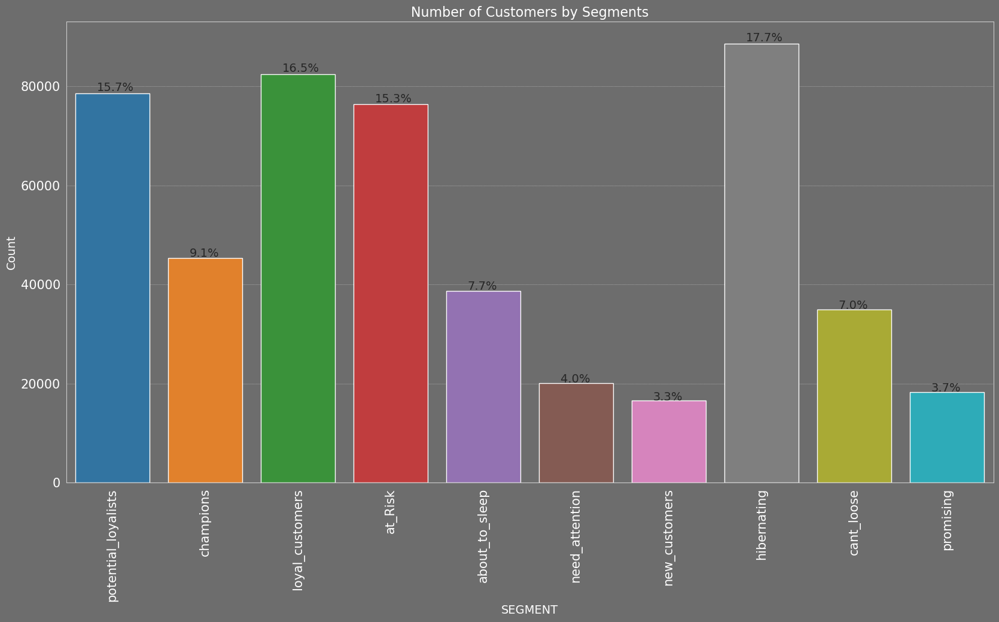

In [21]:
background = "#313332"
backgroundr = "#6D6D6D"
text_color = "w"
title_font="Alegreya Sans"

plt.figure(figsize=(20,15))
fig, ax = plt.subplots(figsize=(20,10))
ax.patch.set_facecolor(backgroundr)
fig.set_facecolor(backgroundr)
fig.facecolor="white"
fig.edgecolor="white"

ax.grid(ls="dotted",lw=0.5,color="lightgrey",zorder=1)
bar_ap = sns.countplot(data = rfm,
                   x = 'segment')
total = len(rfm.segment)
for patch in ax.patches:
    percentage = '{:.1f}%'.format(100 * patch.get_height()/total)
    x = patch.get_x() + patch.get_width() / 2 - 0.17
    y = patch.get_y() + patch.get_height() * 1.005
    ax.annotate(percentage, (x, y), size = 14)
bar_ap.set_xticklabels(bar_ap.get_xticklabels(), rotation=90)
plt.title('Number of Customers by Segments', size = 16, color=text_color)
plt.ylabel('Count', size = 14,color="white" )
plt.xlabel("SEGMENT",fontsize = 14,color="white" )
plt.xticks(size = 15, color="white")
plt.yticks(size = 15, color="white")
plt.show()

In [22]:
x = rfm.segment.value_counts()
fig = px.treemap(x, path=[x.index], values=x)
fig.update_layout(title_text='Distribution of the RFM Segments', title_x=0.5,
                  title_font=dict(size=20))
fig.update_traces(textinfo="label+value+percent root")
fig.show()

1. The hibernate customer segment has decreased to 18%, which is a positive sign. However, we still need to prioritize efforts to re-engage these customers to prevent further declines. We could consider targeted email campaigns, personalized offers, or surveys to better understand why they stopped engaging with our brand and how we can win them back.
 
2. Our loyal customers remain an important segment, and we need to maintain their loyalty through personalized communication and incentives. This could include exclusive offers, personalized communications, or early access to new products or services.

3. The champions segment has decreased to 9%, which suggests that we may need to invest more in engaging with this segment to maintain their loyalty. This could include personalized promotions, rewards programs, or exclusive offers that show appreciation for their loyalty.

4. The potential loyals segment has increased to 16%, which is a positive sign. We should continue to engage with this segment through personalized communications that highlight products or services that may be of interest to them, or special offers to incentivize them to make a purchase.

5. The at-risk segment remains at 12%, and targeted efforts may be necessary to prevent further declines. This could include personalized offers or discounts to win them back, or surveys to better understand their reasons for disengagement.

6. The about-to-sleep segment has decreased to 8%, which is a positive sign. However, we still need to prioritize efforts to prevent these customers from becoming hibernating customers. This could include personalized communications that highlight new products or services, or special offers to incentivize them to make a purchase.

7. For customers in the needs-attention and promising segments, we need to prioritize efforts to increase their engagement and loyalty. This could include personalized recommendations based on their purchase history or interests, or special offers to incentivize them to make a purchase.

8. The can't-lose segment has increased to 7%, which is a positive sign. We should continue to engage with this segment through personalized communications and exclusive offers to maintain their loyalty.

9. For new customers, targeted campaigns may be necessary to increase their engagement and loyalty. This could include personalized communications that highlight products or services that may be of interest to them, or special offers to incentivize them to make a purchase. We should focus on making a good first impression to increase their chances of becoming loyal customers in the future.

In [23]:
d=rfm.head(10)
colorscale = "inferno"
table = ff.create_table(d,colorscale=colorscale)
for i in range(len(table.layout.annotations)):
    table.layout.annotations[i].font.size = 12
iplot(table)

In [24]:
a=rfm[rfm["segment"] == "cant_loose"].head()
colorscale = "inferno"
table = ff.create_table(a,colorscale=colorscale)
for i in range(len(table.layout.annotations)):
    table.layout.annotations[i].font.size = 12
iplot(table)

In [25]:
rfm[["segment", "recency", "frequency", "monetary"]].groupby("segment").agg(["mean", "count"])

recency        frequency          monetary       
                       mean  count      mean  count       mean  count
segment                                                              
about_to_sleep      234.029  38696     1.000  38696  51954.773  38696
at_Risk             320.436  76336     1.000  76336 195766.312  76336
cant_loose          319.048  34932     1.000  34932 627670.500  34932
champions            98.121  45328     1.000  45328 470034.844  45328
hibernating         324.350  88614     1.000  88614  49604.168  88614
loyal_customers     199.903  82492     1.000  82492 454965.000  82492
need_attention      233.598  20116     1.000  20116 140494.312  20116
new_customers       100.724  16540     1.000  16540  25404.598  16540
potential_loyalists 133.622  78631     1.000  78631 110707.922  78631
promising           167.896  18315     1.000  18315  25208.771  18315

In [26]:
rfm.to_csv("/kaggle/working/rfm.csv")


<a id = "6"></a>
<div <h1 <strong style="color:#3F497F;font-size:30px;font-family:Georgia;text-align:center;">FUNCTIONALIZE</strong> </div>

In [27]:
def rfm_analysis(dataframe, csv = False):
    dataframe["last_order"] = pd.to_datetime(dataframe["last_order"])
    dataframe.dtypes
    dataframe["customer_id"] = dataframe["customer_id"].astype(str)
    dataframe["last_order"].max()
    today = dataframe.datetime(2023, 1, 24)

    rfm = dataframe.groupby("customer_id").agg({"last_order": lambda x: (today - x.max()).days,
                                         "qtt_order": lambda x: x.nunique(),
                                         "total_spent": lambda x: x.sum()})
    rfm.columns = ['recency', 'frequency', 'monetary']
    rfm["recency_score"] = pd.qcut(rfm["recency"], 5, labels=[5, 4, 3, 2, 1])
    rfm["frequency_score"] = pd.qcut(rfm["frequency"].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
    rfm["monetary_score"] = pd.qcut(rfm["monetary"], 5, labels=[1, 2, 3, 4, 5])
    rfm["RFM_SCORE"] = (rfm['recency_score'].astype(str) +
                        rfm['frequency_score'].astype(str))
    seg_map = {
        r'[1-2][1-2]': 'hibernating',
        r'[1-2][3-4]': 'at_Risk',
        r'[1-2]5': 'cant_loose',
        r'3[1-2]': 'about_to_sleep',
        r'33': 'need_attention',
        r'[3-4][4-5]': 'loyal_customers',
        r'41': 'promising',
        r'51': 'new_customers',
        r'[4-5][2-3]': 'potential_loyalists',
        r'5[4-5]': 'champions'
    }
    rfm['segment'] = rfm['RFM_SCORE'].replace(seg_map, regex=True)
    rfm = rfm[["recency", "frequency", "monetary", "segment"]]
    rfm.index = rfm.index.astype(int)
    if csv:
        rfm.to_csv("rfm.csv")

    return rfm